# Modelo de estimación de la velocidad #3

### Este modelo busca pasar por anycalib el video y aprender la escala a partir del prior de que entre dos puntos especificos del plano se sabe la distancia entre ellos.

conculsiones: el modelo funciona mucho mejor que la version con los anchos de los autos, pero se depende de medidas especificas de la escena.  
Al ser un prior vertical, el factor de escala que se aprende v amas acorde con las velocidades, ya que el movimiento de los autos va mayoritariamente en ese plano. 

Pros del modelo: Con una medida de distancia puntual de la escena ya podes aprender perfectamente la relacion y estimar velocidades con muy poco error.

Desventajas: se pierde la libertad del modelo previo, el cual aseguraba funcionamiento conn cualquier video en cualquier calle. 

Se predice mejor el factor de relacion Unidades AnyCalib <-> Mundo, pero se pierde la libertad que te da hacerlo sobre YOLO


In [1]:
from src.yolo import run_yolo_tracking
from src.processing import  prepare_ground_truth_with_speed, align_yolo_with_ground_truth, filter_all_tracks, prepare_frame_level_train_test
from src.anycalib import select_best_frames, run_anycalib_pipeline, average_bbox_width_in_roi, estimate_scale_from_rectangle, compute_speeds_for_all_cars
from src.metrics import evaluate_split


import torch
import numpy as np
import pandas as pd
from PIL import Image
import glob, os
import matplotlib.pyplot as plt
import torch.nn.functional as F
from anycalib import AnyCalib


## Train


### Etapa YOLO


In [2]:


csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video3/video3_raw.mp4",
    base_dir="data/processed/video3",
    csv_filename="video3_track.csv",
    run_name="yolo_track_video3",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 61.5ms
video 1/1 (frame 2/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 11.0ms
video 1/1 (frame 3/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.5ms
video 1/1 (frame 4/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 11.3ms
video 1/1 (frame 5/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.5ms
video 1/1 (frame 6/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 7.0ms
video 1/1 (frame 7/25383) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video3\video3_raw.mp4: 384x640 2 cars, 10.8ms
v

### preprocesamiento del resultado de YOLO

YOLO detecta muchos vehiculos que el ground truth no tiene, asi que vamos a eliminar esas detecciones innecesara.
Tambien difieren en ID, asi que tambien hacemos que coincida el ID del vehiculo en ambos dataset

In [4]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video3/gt_video3_raw.xml",
    filtered_xml="data/processed/video3/gt/gt_video3_processed.xml",
    output_csv="data/processed/video3/gt/gt_video3_processed.csv"
)

[filter_vehicles_with_radar] Vehículos totales en data/raw/video3/gt_video3_raw.xml: 550
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 53
[filter_vehicles_with_radar] Vehículos restantes con radar: 497
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video3/gt/gt_video3_processed.xml
[convert_xml_to_csv] Vehículos procesados: 497
[convert_xml_to_csv] CSV guardado en: data/processed/video3/gt/gt_video3_processed.csv


In [5]:


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video3/video3_track.csv",
    gt_csv="data/processed/video3/gt/gt_video3_processed.csv",
    output_aligned_csv="data/processed/video3/video3_track_id.csv",
    frame_tolerance=1,
)


Coincidencias encontradas: 473 de 497 vehículos GT
Total de vehículos únicos preservados: 473

Proceso de alineación completado.


In [6]:

df_all_stable = filter_all_tracks(
    input_csv="data/processed/video3/video3_track_id.csv",
    output_csv="data/processed/video3/video3_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)


Tracks encontrados: [   1    5    7   12   15   16   17   28   31   35   38   40   41   47   50   56   58   60   61   67   70   83   89   91   92   96   98  107  119  124  125  164  196  203  207  220  221  226  238  242  243  244  246  247  253  259  265  268  269  272  275  285  289  292  299  302  317  326  330  332  343  346  350
  351  355  359  360  364  371  372  376  383  386  402  409  446  452  459  464  466  476  487  501  505  510  519  524  527  530  538  539  540  546  552  559  561  570  572  576  579  584  586  617  619  625  628  631  636  639  655  660  664  682  690  695  696  700  701  705  711  724  726  748  762  770  778
  799  807  813  816  817  819  823  824  835  837  849  852  858  869  874  879  881  882  884  899  902  919  923  926  927  928  940  943  947  951  954  956  963  964  966  978  982  989  995  997 1001 1007 1028 1088 1103 1112 1117 1124 1140 1145 1150 1152 1161 1167 1170 1173 1177 1178 1184 1186 1191 1200 1203
 1212 1219 1224 1232 1241 1254 1

In [7]:


df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video3/video3_track_id_filtered.csv",
    gt_csv="data/processed/video3/gt/gt_video3_processed.csv",
    fps=25.0,
    test_size=0,
    random_seed=42,
    train_out="data/processed/video3/train_video3.csv",
    test_out="data/processed/video3/test_video3.csv",
    min_frames_per_gt=None,   
)


Vehículos con tracks:          470
Vehículos con GT de velocidad: 497
Vehículos en intersección:     470

Split por vehículo (IDs):
  Total vehículos: 470
  Train IDs:       470
  Test IDs:        0

Filas a nivel frame:
  Train frames: 21411
  Test frames:  0

Archivos generados:
  - data/processed/video3/train_video3.csv
  - data/processed/video3/test_video3.csv


### Etapa Anycalib


In [8]:

select_best_frames(
    video_path="data/raw/video3/video3_raw.mp4",
    output_dir="src/anycalib_frames_3",
    num_frames=12,
    frame_step=30,
    resize_width=None
)


Seleccionando 12 mejores frames
Listo! Se guardaron 13 frames en 'src/anycalib_frames_3'.


In [9]:
ORIG_W = 1920
ORIG_H = 1080
FRAME_DIR = "src/anycalib_frames_3"

frame_paths = sorted(glob.glob(os.path.join(FRAME_DIR, "*")))
assert len(frame_paths) > 0, "No encontré imágenes en anycalib_frames/"
calib_frame_path = frame_paths[0]  

print("Frame de calibración:", calib_frame_path)


Frame de calibración: src/anycalib_frames_3\anycalib_frame_000000.png


Tamaño imagen de calibración (H, W): (1080, 1920)


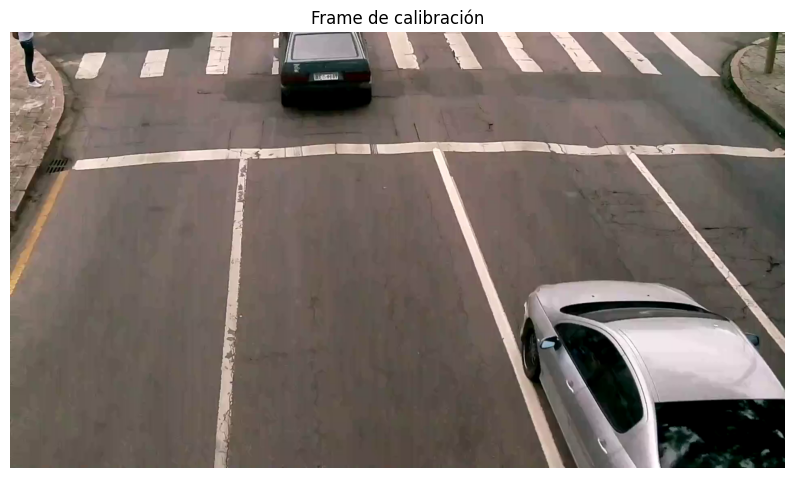

In [10]:
img = Image.open(calib_frame_path).convert("RGB")
img_np = np.array(img)
H, W, _ = img_np.shape

print("Tamaño imagen de calibración (H, W):", (H, W))

plt.figure(figsize=(10,6))
plt.imshow(img_np)
plt.title("Frame de calibración")
plt.axis("off")
plt.show()


In [11]:


img_np = np.array(Image.open("src/anycalib_frames_3/anycalib_frame_000000.png").convert("RGB"))

res = run_anycalib_pipeline(img_np)

intrinsics = res["intrinsics"]
rays_dir_full = res["rays_dir_full"]
pixel_to_world = res["pixel_to_world"]
pixel_to_world_from_yolo = res["pixel_to_world_from_yolo"]
H = res["H"]
W = res["W"]



Device: cuda
Intrinsics: tensor([1851.4703, 1838.2463,  958.4194,  539.8022], device='cuda:0')
pred_size: (238, 420)
rays shape: torch.Size([99960, 3])
rays_dir_full shape: (1080, 1920, 3)


c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\src\anycalib.py:155: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(rays_dir, dtype=torch.float32, device=device)


In [12]:

df_train_tracks = pd.read_csv("data/processed/video3/train_video3.csv")

mean_w_roi, median_w_roi, n_roi = average_bbox_width_in_roi(
    df=df_train_tracks,
    class_ids=(0,),          
    min_conf=0.5,            
    x_left_trim_ratio=0.33,  
    x_right_trim_ratio=0.43, 
    y_top_trim_ratio=0.33,   
    y_bottom_trim_ratio=0.33,
    img_width=1920,
    img_height=1080,
)


ROI X: [633.6, 1094.4]
ROI Y: [356.4, 723.6]
Ancho promedio bbox_w (ROI): 335.37 px
Ancho mediano  bbox_w (ROI): 335.27 px
Cant. cajas usadas (ROI)    : 1895


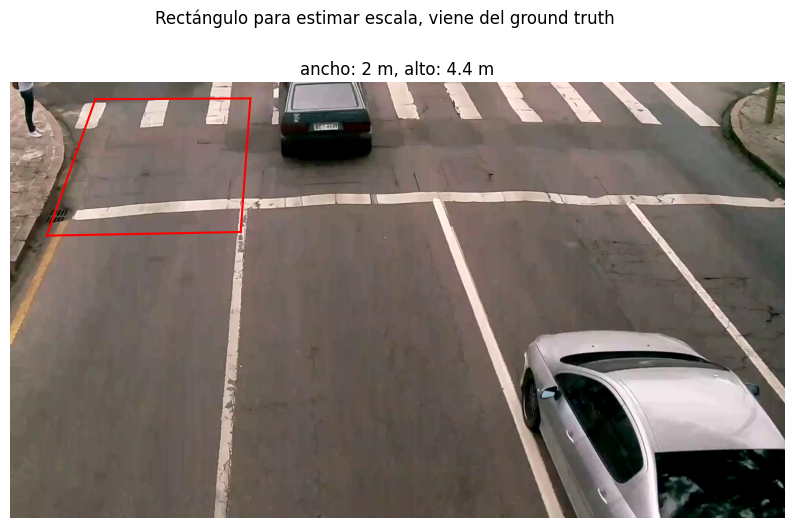

In [13]:
#graficar los puntos en la imagen de calibración
TL = (211, 42)
TR = (595, 40)
BL = (91, 380)
BR = (571, 371)

plt.figure(figsize=(10,6))
plt.imshow(img_np)
plt.plot([TL[0], TR[0]], [TL[1], TR[1]], 'r-')  # Top edge
plt.plot([BL[0], BR[0]], [BL[1], BR[1]], 'r-')  # Bottom edge
plt.plot([TL[0], BL[0]], [TL[1], BL[1]], 'r-')  # Left edge
plt.plot([TR[0], BR[0]], [TR[1], BR[1]], 'r-')  # Right edge
plt.suptitle("Rectángulo para estimar escala, viene del ground truth")
plt.title("ancho: 2 m, alto: 4.4 m")
plt.axis("off")
plt.show()

In [14]:

df_train_tracks = pd.read_csv("data/processed/video3/train_video3.csv")
df_test_tracks  = pd.read_csv("data/processed/video3/test_video3.csv")

print("Frames en train:", len(df_train_tracks))
print("Frames en test:", len(df_test_tracks))



s_width, s_height = estimate_scale_from_rectangle(
    pixel_to_world_fn=pixel_to_world,
    width_m=2.0,
    height_m=4.4,
)

print("\nEscala global aprendida en TRAIN:", s_height)

# --- TRAIN ---
df_vel_train, df_stats_train = compute_speeds_for_all_cars(
    df=df_train_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_height,  
    fps=25.0,               
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)



df_vel_train.to_csv("data/processed/video3/video3_speeds_per_frame_train.csv", index=False)
df_stats_train.to_csv("data/processed/video3/speeds_per_vehicle_train.csv", index=False)


print("\nVelocidades calculadas:")
print("  Vehículos en TRAIN:", len(df_stats_train))


Frames en train: 21411
Frames en test: 0
Ancho en unidades AnyCalib  (top/bot): 0.2041, 0.2593
Alto en unidades AnyCalib   (left/right): 0.1940, 0.1747

Escala lateral   (desde ancho 2.0 m):  s_width  = 8.6321 m/u
Escala longitudinal (desde alto 4.4 m): s_height = 23.8710 m/u

Escala global aprendida en TRAIN: 23.87105

Velocidades calculadas:
  Vehículos en TRAIN: 451


### utilizamos la escala aprendida en altura, la longitudinal


Métricas usando la MEDIA por auto [train]:
  MAE   (km/h): 4.49
  MedAE (km/h): 3.06
  RMSE  (km/h): 7.36
  MAPE    (%): 11.88
  R²         : 0.494
  Vehículos evaluados: 451


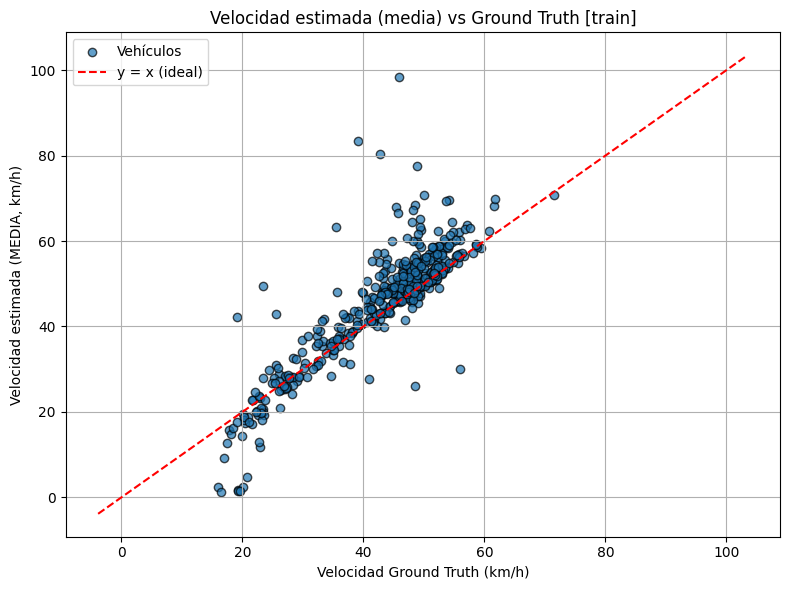

In [15]:


df_gt = pd.read_csv("data/processed/video3/gt/gt_video3_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_train, df_gt, split_name="train")


hacemos para el video 2, usando las escalas que sacamos de el video 1


# video 4


In [16]:

csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video4/video4_raw.mp4",
    base_dir="data/processed/video4",
    csv_filename="video4_track.csv",
    run_name="yolo_track_video4",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 14.7ms
video 1/1 (frame 2/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 13.6ms
video 1/1 (frame 3/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 15.0ms
video 1/1 (frame 4/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 13.8ms
video 1/1 (frame 5/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 15.1ms
video 1/1 (frame 6/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 26.1ms
video 1/1 (frame 7/14332) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video4\video4_raw.mp4: 384x640 1 car, 27.0ms
video

In [17]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video4/gt_video4_raw.xml",
    filtered_xml="data/processed/video4/gt/gt_video4_processed.xml",
    output_csv="data/processed/video4/gt/gt_video4_processed.csv"
)

[filter_vehicles_with_radar] Vehículos totales en data/raw/video4/gt_video4_raw.xml: 163
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 19
[filter_vehicles_with_radar] Vehículos restantes con radar: 144
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video4/gt/gt_video4_processed.xml
[convert_xml_to_csv] Vehículos procesados: 144
[convert_xml_to_csv] CSV guardado en: data/processed/video4/gt/gt_video4_processed.csv


In [29]:


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video4/video4_track.csv",
    gt_csv="data/processed/video4/gt/gt_video4_processed.csv",
    output_aligned_csv="data/processed/video4/video4_track_id.csv",
    frame_tolerance=1,
)


Coincidencias encontradas: 142 de 144 vehículos GT
Total de vehículos únicos preservados: 142

Proceso de alineación completado.


In [30]:

df_all_stable = filter_all_tracks(
    input_csv="data/processed/video4/video4_track_id.csv",
    output_csv="data/processed/video4/video4_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)


Tracks encontrados: [  4   8  10  18  20  24  28  31  39  43  50  57  58  64  65  67  74 111 124 125 127 128 131 133 134 138 139 141 145 150 155 169 185 191 193 194 197 198 201 207 211 218 225 232 236 239 245 246 247 252 256 259 261 266 267 273 275 276 279 284 285 291 292 295 300 303 311 313 315 317 318 319 322 325 329 330 362 364 367
 368 369 370 373 374 376 377 380 381 385 388 398 402 408 409 424 425 426 437 439 443 448 455 456 460 462 463 468 474 478 481 487 488 491 496 506 509 511 517 555 565 570 572 577 592 596 598 602 604 609 611 614 617 621 625 632 638 641 656 659 662 664 668]
Track 4: 49 frames → 37 estables
Track 8: 49 frames → 37 estables
Track 10: 25 frames → 21 estables
Track 18: 38 frames → 28 estables
Track 20: 32 frames → 25 estables
Track 24: 35 frames → 26 estables
Track 28: 34 frames → 26 estables
Track 31: 29 frames → 22 estables
Track 39: 32 frames → 22 estables
Track 43: 37 frames → 27 estables
Track 50: 38 frames → 28 estables
Track 57: 35 frames → 26 estables
Tra

In [20]:


df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video4/video4_track_id_filtered.csv",
    gt_csv="data/processed/video4/gt/gt_video4_processed.csv",
    fps=25.0,
    test_size=1.0,
    random_seed=42,
    train_out="data/processed/video4/train_video4.csv",
    test_out="data/processed/video4/test_video4.csv",
    min_frames_per_gt=None,   
)


Vehículos con tracks:          142
Vehículos con GT de velocidad: 144
Vehículos en intersección:     142

Split por vehículo (IDs):
  Total vehículos: 142
  Train IDs:       0
  Test IDs:        142

Filas a nivel frame:
  Train frames: 0
  Test frames:  5332

Archivos generados:
  - data/processed/video4/train_video4.csv
  - data/processed/video4/test_video4.csv


In [21]:


df_test_tracks  = pd.read_csv("data/processed/video4/test_video4.csv")

print("Frames en test:", len(df_test_tracks))



# --- TEST ---
df_vel_test, df_stats_test = compute_speeds_for_all_cars(
    df=df_test_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_height,      
    fps=25.0,
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)



df_vel_test.to_csv("data/processed/video4/speeds_per_frame_test.csv", index=False)
df_stats_test.to_csv("data/processed/video4/speeds_per_vehicle_test.csv", index=False)

print("\nVelocidades calculadas:")

print("  Vehículos en TEST: ", len(df_stats_test))


Frames en test: 5332

Velocidades calculadas:
  Vehículos en TEST:  138



Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 4.40
  MedAE (km/h): 3.97
  RMSE  (km/h): 6.53
  MAPE    (%): 10.06
  R²         : 0.558
  Vehículos evaluados: 138


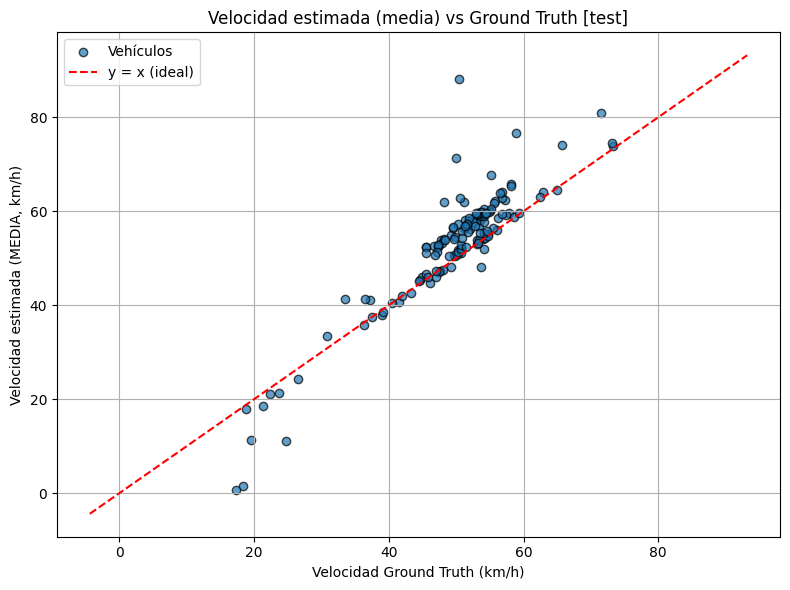

In [22]:


df_gt = pd.read_csv("data/processed/video4/gt/gt_video4_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_test,  df_gt, split_name="test")


video 2


In [23]:

csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video2/video2_raw.mp4",
    base_dir="data/processed/video2",
    csv_filename="video2_track.csv",
    run_name="yolo_track_video2",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 31.1ms
video 1/1 (frame 2/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 27.6ms
video 1/1 (frame 3/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 25.6ms
video 1/1 (frame 4/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 8.0ms
video 1/1 (frame 5/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 10.7ms
video 1/1 (frame 6/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 8.1ms
video 1/1 (frame 7/9120) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video2\video2_raw.mp4: 384x640 4 cars, 8.8ms
video 1/

In [24]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video2/gt_video2_raw.xml",
    filtered_xml="data/processed/video2/gt/gt_video2_processed.xml",
    output_csv="data/processed/video2/gt/gt_video2_processed.csv"
)


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video2/video2_track.csv",
    gt_csv="data/processed/video2/gt/gt_video2_processed.csv",
    output_aligned_csv="data/processed/video2/video2_track_id.csv",
    frame_tolerance=1,
)


df_all_stable = filter_all_tracks(
    input_csv="data/processed/video2/video2_track_id.csv",
    output_csv="data/processed/video2/video2_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)



df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video2/video2_track_id_filtered.csv",
    gt_csv="data/processed/video2/gt/gt_video2_processed.csv",
    fps=25.0,
    test_size=1.0,
    random_seed=42,
    train_out="data/processed/video2/train_video2.csv",
    test_out="data/processed/video2/test_video2.csv",
    min_frames_per_gt=None,   
)



[filter_vehicles_with_radar] Vehículos totales en data/raw/video2/gt_video2_raw.xml: 168
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 16
[filter_vehicles_with_radar] Vehículos restantes con radar: 152
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video2/gt/gt_video2_processed.xml
[convert_xml_to_csv] Vehículos procesados: 152
[convert_xml_to_csv] CSV guardado en: data/processed/video2/gt/gt_video2_processed.csv
Coincidencias encontradas: 148 de 152 vehículos GT
Total de vehículos únicos preservados: 148

Proceso de alineación completado.
Tracks encontrados: [  1   3   9  14  21  22  26  27  29  30  40  45  48  50  51  52  55  57  58  60  62  71  77  78  86  88  91  94  96 103 106 127 154 155 156 157 159 163 167 170 176 181 183 193 198 208 211 214 220 221 222 224 225 227 228 237 245 246 247 248 250 258 259 260 263 271 306 313 314 315 327 329 332 337 341 344 347 353 355
 360 368 370 373 374 376 411 428 430 431 433 436 442 445 449 450 453 459 462 46

Frames en test: 5306

Velocidades calculadas:
  Vehículos en TEST:  144

Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 2.74
  MedAE (km/h): 1.74
  RMSE  (km/h): 4.23
  MAPE    (%): 6.75
  R²         : 0.810
  Vehículos evaluados: 144


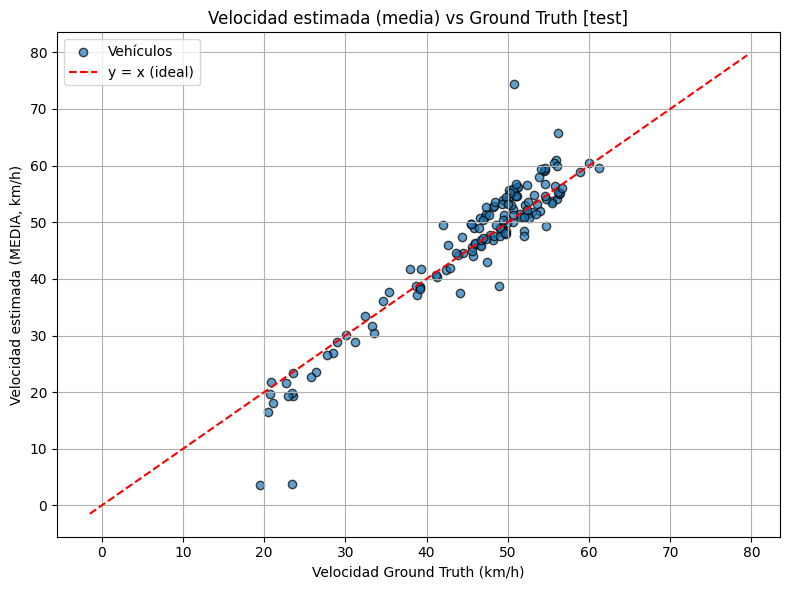

In [25]:


df_test_tracks  = pd.read_csv("data/processed/video2/test_video2.csv")

print("Frames en test:", len(df_test_tracks))



# --- TEST ---
df_vel_test, df_stats_test = compute_speeds_for_all_cars(
    df=df_test_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_height,      
    fps=25.0,
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)



df_vel_test.to_csv("data/processed/video2/speeds_per_frame_test.csv", index=False)
df_stats_test.to_csv("data/processed/video2/speeds_per_vehicle_test.csv", index=False)

print("\nVelocidades calculadas:")

print("  Vehículos en TEST: ", len(df_stats_test))



df_gt = pd.read_csv("data/processed/video2/gt/gt_video2_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_test,  df_gt, split_name="test")

In [26]:

csv_path, video_dir = run_yolo_tracking(
    weights_path="src./finetuned-detrac-weights.pt",
    video_source="data/raw/video1/video1_raw.mp4",
    base_dir="data/processed/video1",
    csv_filename="video1_track.csv",
    run_name="yolo_track_video1",
    conf=0.5,
    iou=0.6,
)



video 1/1 (frame 1/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 2 cars, 8.5ms
video 1/1 (frame 2/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 2 cars, 9.0ms
video 1/1 (frame 3/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 2 cars, 7.3ms
video 1/1 (frame 4/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 1 car, 8.0ms
video 1/1 (frame 5/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 (no detections), 7.3ms
video 1/1 (frame 6/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 (no detections), 7.7ms
video 1/1 (frame 7/6918) c:\Users\Mati\Desktop\VisionTrafficGuard\speed_anycalib_prior\data\raw\video1\video1_raw.mp4: 384x640 (no detec

In [27]:


prepare_ground_truth_with_speed(
    input_xml="data/raw/video1/gt_video1_raw.xml",
    filtered_xml="data/processed/video1/gt/gt_video1_processed.xml",
    output_csv="data/processed/video1/gt/gt_video1_processed.csv"
)


df_aligned, mapping = align_yolo_with_ground_truth(
    yolo_tracks_csv="data/processed/video1/video1_track.csv",
    gt_csv="data/processed/video1/gt/gt_video1_processed.csv",
    output_aligned_csv="data/processed/video1/video1_track_id.csv",
    frame_tolerance=1,
)


df_all_stable = filter_all_tracks(
    input_csv="data/processed/video1/video1_track_id.csv",
    output_csv="data/processed/video1/video1_track_id_filtered.csv",
    orig_h=1080,
    margin_bottom_px=20,
    margin_top_px=50,  
)



df_train, df_test = prepare_frame_level_train_test(
    tracks_csv="data/processed/video1/video1_track_id_filtered.csv",
    gt_csv="data/processed/video1/gt/gt_video1_processed.csv",
    fps=25.0,
    test_size=1.0,
    random_seed=42,
    train_out="data/processed/video1/train_video1.csv",
    test_out="data/processed/video1/test_video1.csv",
    min_frames_per_gt=None,   
)



[filter_vehicles_with_radar] Vehículos totales en data/raw/video1/gt_video1_raw.xml: 119
[filter_vehicles_with_radar] Vehículos sin radar eliminados: 9
[filter_vehicles_with_radar] Vehículos restantes con radar: 110
[filter_vehicles_with_radar] XML filtrado guardado en: data/processed/video1/gt/gt_video1_processed.xml
[convert_xml_to_csv] Vehículos procesados: 110
[convert_xml_to_csv] CSV guardado en: data/processed/video1/gt/gt_video1_processed.csv
Coincidencias encontradas: 107 de 110 vehículos GT
Total de vehículos únicos preservados: 107

Proceso de alineación completado.
Tracks encontrados: [  5   6  15  18  19  20  21  26  30  33  34  37  44  49  50  58  60  61  65  69  70  73  94 107 109 112 117 123 124 129 134 140 141 148 149 151 152 155 159 163 169 170 171 177 179 180 181 183 186 187 188 190 193 194 197 198 199 200 206 208 209 213 214 215 216 217 236 254 255 261 285 292 296 299 300 310 312 314 315
 318 322 326 337 338 339 343 344 345 349 350 352 362 363 368 380 383 391 392 393

Frames en test: 4053

Velocidades calculadas:
  Vehículos en TEST:  105

Métricas usando la MEDIA por auto [test]:
  MAE   (km/h): 3.72
  MedAE (km/h): 1.83
  RMSE  (km/h): 6.32
  MAPE    (%): 9.24
  R²         : 0.679
  Vehículos evaluados: 105


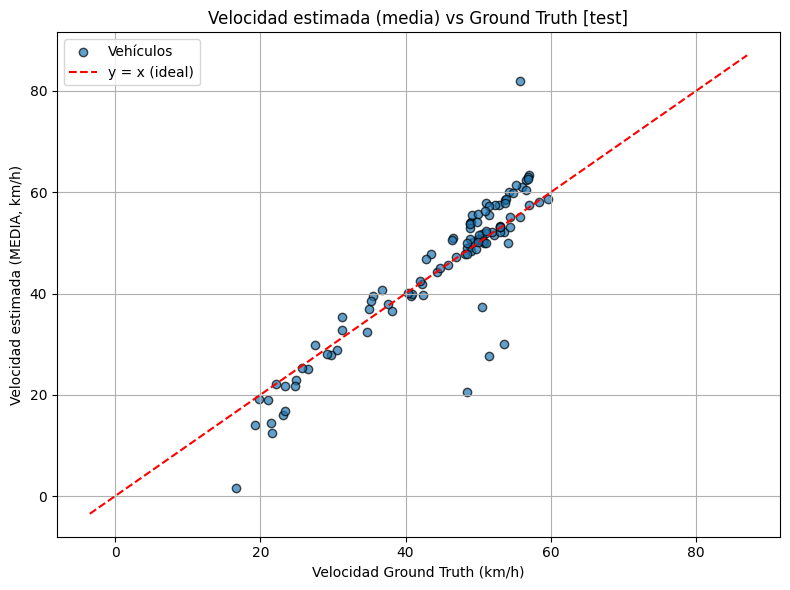

In [28]:


df_test_tracks  = pd.read_csv("data/processed/video1/test_video1.csv")

print("Frames en test:", len(df_test_tracks))



# --- TEST ---
df_vel_test, df_stats_test = compute_speeds_for_all_cars(
    df=df_test_tracks,
    pixel_to_world_fn=pixel_to_world_from_yolo,
    s_global=s_height,      
    fps=25.0,
    car_class_ids=(0,),
    cy_quantile=0.3,
    min_frames_per_car=5,
)



df_vel_test.to_csv("data/processed/video1/speeds_per_frame_test.csv", index=False)
df_stats_test.to_csv("data/processed/video1/speeds_per_vehicle_test.csv", index=False)

print("\nVelocidades calculadas:")

print("  Vehículos en TEST: ", len(df_stats_test))



df_gt = pd.read_csv("data/processed/video1/gt/gt_video1_processed.csv").rename(
    columns={"vehicle_id": "gt_id", "speed": "speed_gt_kmh"}
)
df_gt["speed_gt_kmh"] = pd.to_numeric(df_gt["speed_gt_kmh"], errors="coerce")


evaluate_split(df_stats_test,  df_gt, split_name="test")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    mean_absolute_error, median_absolute_error, 
    mean_squared_error, r2_score, confusion_matrix
)

datasets = {
    "video1": {
        "gt":   "data/processed/video1/gt/gt_video1_processed.csv",
        "pred": "data/processed/video1/speeds_per_vehicle_test.csv"
    },
    "video2": {
        "gt":   "data/processed/video2/gt/gt_video2_processed.csv",
        "pred": "data/processed/video2/speeds_per_vehicle_test.csv"
    },
    "video4": {
        "gt":   "data/processed/video4/gt/gt_video4_processed.csv",
        "pred": "data/processed/video4/speeds_per_vehicle_test.csv"
    },
}

dfs = []

for video_id, paths in datasets.items():
    # Cargar archivos
    gt = pd.read_csv(paths["gt"])
    pred = pd.read_csv(paths["pred"])

    # Convertir a string los IDs para evitar errores de merge
    gt["vehicle_id"] = gt["vehicle_id"].astype(str)
    pred["gt_id"]    = pred["gt_id"].astype(str)

    # Crear unique_id
    gt["unique_id"]  = video_id + "_" + gt["vehicle_id"]
    pred["unique_id"] = video_id + "_" + pred["gt_id"]

    # El GT tiene la velocidad real en la columna "speed"
    gt = gt[["unique_id", "speed"]].rename(columns={"speed": "speed_gt"})

    # Merge 1-a-1
    df = pred.merge(gt, on="unique_id", how="inner")

    # Guardar el id del video
    df["video_id"] = video_id

    dfs.append(df)

df_all = pd.concat(dfs, ignore_index=True)
print("Vehículos totales combinados:", len(df_all))

gt = df_all["speed_gt"].values
pred = df_all["speed_kmh_mean"].values

mae  = mean_absolute_error(gt, pred)
medae = median_absolute_error(gt, pred)
rmse = np.sqrt(mean_squared_error(gt, pred))
r2 = r2_score(gt, pred)
mape = np.mean(np.abs((gt - pred) / gt)) * 100

print("\n===== MÉTRICAS GLOBALES =====")
print(f"MAE   (km/h): {mae:.2f}")
print(f"MedAE (km/h): {medae:.2f}")
print(f"RMSE  (km/h): {rmse:.2f}")
print(f"MAPE    (%): {mape:.2f}")
print(f"R²         : {r2:.3f}")
print(f"Vehículos evaluados: {len(df_all)}")



Vehículos totales combinados: 387

===== MÉTRICAS GLOBALES =====
MAE   (km/h): 3.60
MedAE (km/h): 2.27
RMSE  (km/h): 5.72
MAPE    (%): 8.61
R²         : 0.695
Vehículos evaluados: 387


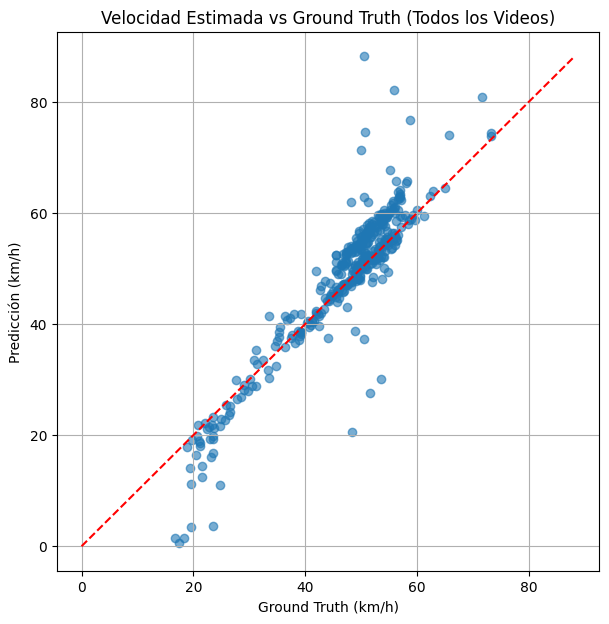

In [3]:
plt.figure(figsize=(7,7))
plt.scatter(gt, pred, alpha=0.6)

max_v = max(gt.max(), pred.max())
plt.plot([0, max_v], [0, max_v], 'r--')

plt.xlabel("Ground Truth (km/h)")
plt.ylabel("Predicción (km/h)")
plt.title("Velocidad Estimada vs Ground Truth (Todos los Videos)")
plt.grid(True)
plt.show()
